In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import h5py as h5
import sys
import os
from pathlib import Path
from importlib import reload

sys.path.append('../')
import waveform_processing as proc
reload(proc)

sns.reset_orig() # reset original matplotlib RC params

In [2]:
plt.style.use('dark_background')
#matplotlib.rcParams.keys()
plt.rcParams['figure.figsize'] = (10, 6)
plt.rc('font', size=12)
length = 8
width = 1.5
plt.rcParams['xtick.major.size'] = length
plt.rcParams['ytick.major.size'] = length
plt.rcParams['xtick.major.width'] = width
plt.rcParams['ytick.major.width'] = width

In [3]:
data_path = Path('/reg/d/psdm/sxr/sxr12416/results/vesp')

In [4]:
runs = np.arange(60,111)
pe_all = []
r_all = []
I0_all = []
gas_att_all = []
for ii, run in enumerate(runs):
    fname = data_path / './GMD_r{}.h5'.format(str(run))
    with h5.File(fname,'r') as f:
        pe_all.append(f['phE'].value)
        I0_all.append(f['gmd_I0'].value)
        gas_att_all.append(f['att'].value)
        r_all.append(np.zeros(pe_all[ii].shape) + run)
        
pe_all = np.concatenate(pe_all, axis=0)
r_all = np.concatenate(r_all, axis=0)
I0_all = np.concatenate(I0_all, axis=0)
gas_att_all = np.concatenate(gas_att_all, axis=0)

## Photon energy and attenuation settings overview

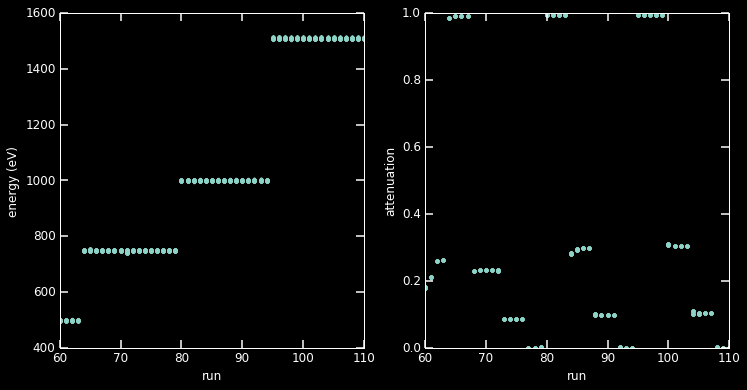

In [5]:
fig, ax = plt.subplots(ncols=2, figsize=(12,6))
ax[0].plot(r_all, pe_all, '.')
ax[0].set_xlabel('run')
ax[0].set_ylabel('energy (eV)')

ax[1].plot(r_all, gas_att_all, '.')
ax[1].set_xlabel('run')
ax[1].set_ylabel('attenuation')
plt.show()

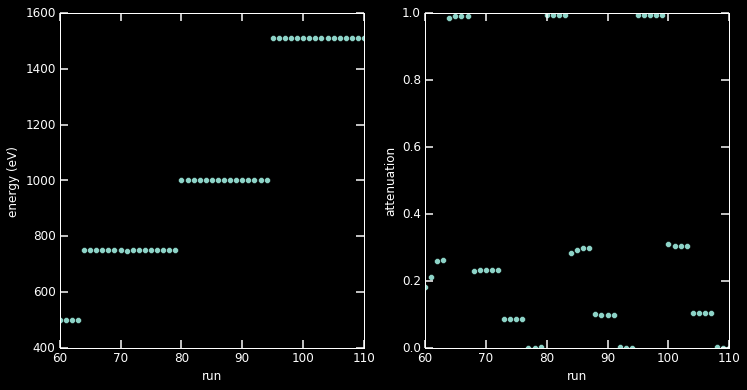

In [6]:
att = np.asarray([np.mean(gas_att_all[r_all==run]) for run in runs])
en = np.asarray([np.mean(pe_all[r_all==run]) for run in runs])

fig, ax = plt.subplots(ncols=2, figsize=(12,6))
ax[0].plot(runs, en, 'o')
ax[0].set_xlabel('run')
ax[0].set_ylabel('energy (eV)')

ax[1].plot(runs, att, 'o')
ax[1].set_xlabel('run')
ax[1].set_ylabel('attenuation')
plt.show()

## Waveform as a function of energy

/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r62.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r66.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r82.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r98.h5
(4, 500, 5000)


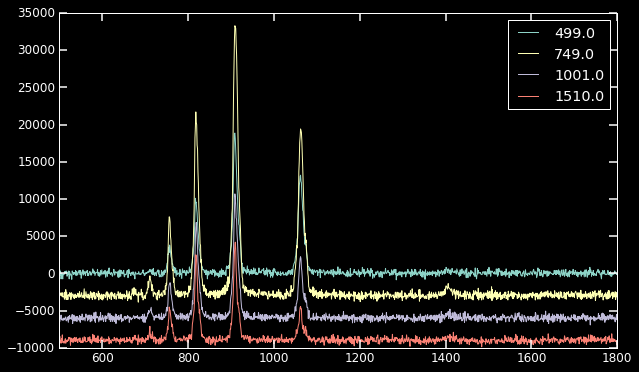

In [7]:
r_refs = [62,66,82,98]
# rs = [82]
en_ph = np.round([np.squeeze(en[runs==r]) for r in r_refs])

wf_ref = []
for rr in r_refs:
    fname = data_path / './GMD_r{}.h5'.format(str(rr))
    print(fname)
    with h5.File(fname,'r') as f:
        wf_ref.append(f['GMD'].value)
wf_ref = np.asarray(wf_ref)
print(wf_ref.shape)

fig, ax = plt.subplots()
for ii in range(len(r_refs)):
    ax.plot(wf_ref[ii,100,:]-ii*3000, label=en_ph[ii])
ax.set_xlim(500,1800)
ax.legend()
plt.show()

In [8]:
roi = [500,1600]
wf_ref = wf_ref[:,:,roi[0]:roi[1]]

## Fit everything with a basis at a single energy

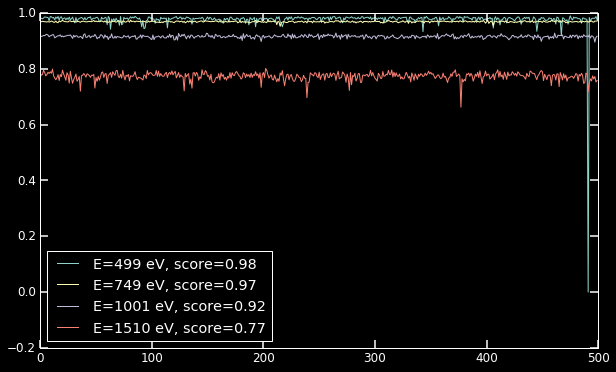

In [9]:
n_c = 2
regr = proc.construct_waveformRegressor(wf_ref[0,:100,:], n_components=n_c)
fig, ax = plt.subplots()
for ii, rr in enumerate(r_refs):
    intensities = regr.get_pulse_intensity(wf_ref[ii,:,:])
    score = regr.score(wf_ref[ii,:,:])
    leg = 'E={:d} eV, score={:.2}'.format(int(en_ph[ii]), np.mean(score))
    ax.plot(score, label=leg)
plt.legend(loc=0)
plt.show()

## Fit with each its own basis

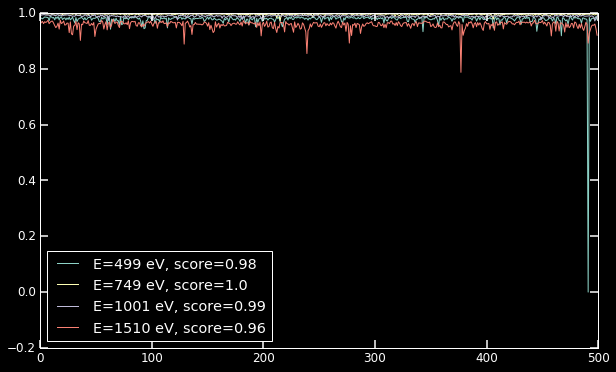

In [10]:
n_c = 2
fig, ax = plt.subplots()
for ii, rr in enumerate(r_refs):
    regr = proc.construct_waveformRegressor(wf_ref[ii,:100,:], n_components=n_c)
    intensities = regr.get_pulse_intensity(wf_ref[ii,:,:])
    score = regr.score(wf_ref[ii,:,:])
    leg = 'E={:d} eV, score={:.2}'.format(int(en_ph[ii]), np.mean(score))
    ax.plot(score, label=leg)
plt.legend(loc=0)
plt.show()

# Different attenuation at each energy with one basis per energy on the highest transmission

## E = 500 eV

/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r60.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r61.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r62.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r63.h5


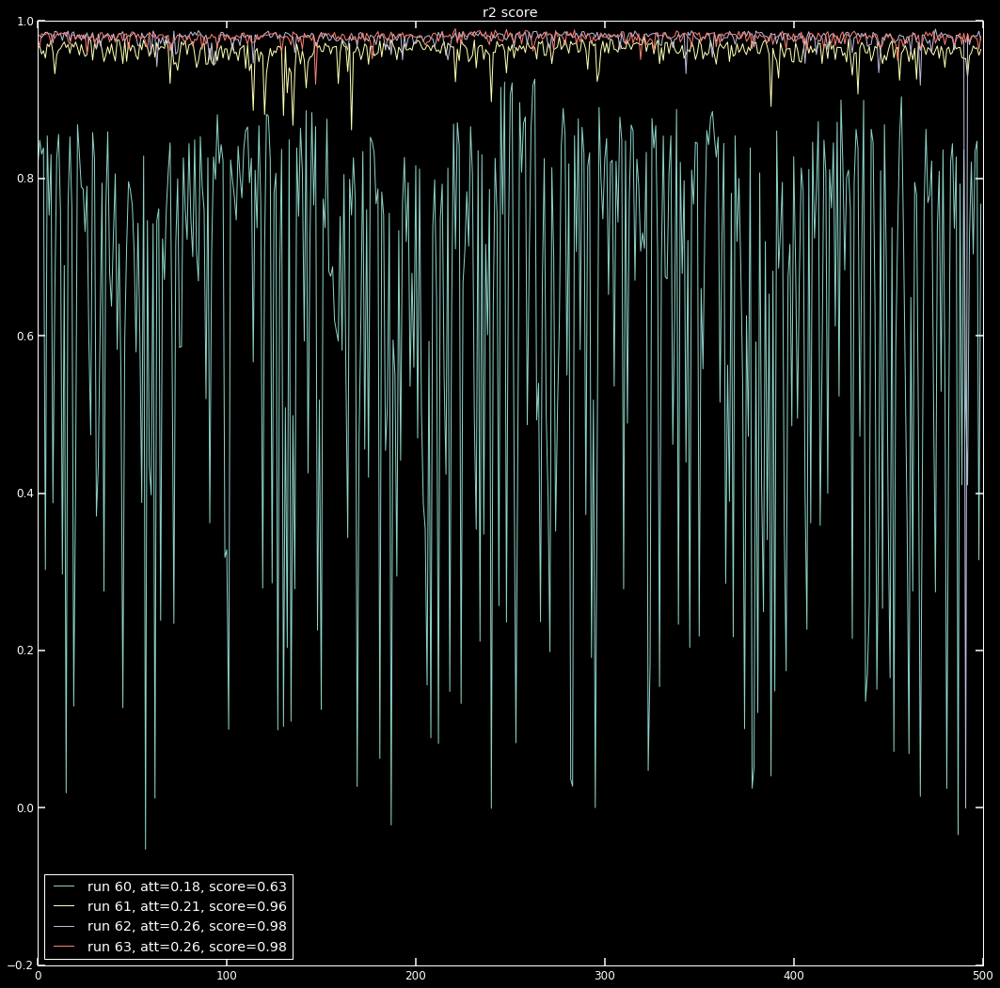

In [11]:
E = 500
filt = np.logical_and(np.greater(en,E-50), np.less(en,E+50))
att_e = att[filt]
rs = runs[filt]

plt_fit = False

n_c = 2
regr = proc.construct_waveformRegressor(wf_ref[0,:100,:], n_components=n_c) # idx 1 = 750eV
scores = []
fig, ax1 = plt.subplots(figsize=(18,18))
ax1.set_title('r2 score')
# fig, ax2 = plt.subplots(figsize=(18,18))
# ax2.set_title('Pearson coeff')
for jj, (rr, at) in enumerate(zip(rs,att_e)):
    fname = data_path / './GMD_r{}.h5'.format(str(rr))
    print(fname)
    with h5.File(fname,'r') as f:
        wf = f['GMD'].value[:,roi[0]:roi[1]]
    wf = np.asarray(wf)
    
    intensities = regr.get_pulse_intensity(wf)
    reconstructed = regr.fit_reconstruct(wf)
    score = regr.score(wf)
    scores.append(score)
    pearson = regr.pearsonr_coeff(wf)
    
    leg = 'run {}, att={:.2}, score={:.2}'.format(rr, at, np.mean(score))
    ax1.plot(score, label=leg)
#     leg = 'run {}, att={:.2}, Pearson={:.2}'.format(rr, at, np.mean(pearson))
#     ax2.plot(pearson, label=leg)
    
    if plt_fit:
        fig, ax = plt.subplots(1,3, figsize=(15,6))
        ax = np.ravel(ax)
        for ii in range(3):
            idx = np.random.randint(wf.shape[0])
            ax[ii].plot(wf[idx])
            ax[ii].plot(reconstructed[idx], 'b')
            ax[ii].set_title('att {:.3f}\n{}\nscore: {:.3f}'.format(att_e[jj], str(idx), score[idx]))
            ax[ii].set_xlim(150,650)
        plt.tight_layout()
ax1.legend(loc=0)
# ax2.legend(loc=0)
plt.show()

## E = 750 eV

/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r64.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r65.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r66.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r67.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r68.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r69.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r70.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r71.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r72.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r73.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r74.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r75.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r76.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r77.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r78.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r79.h5


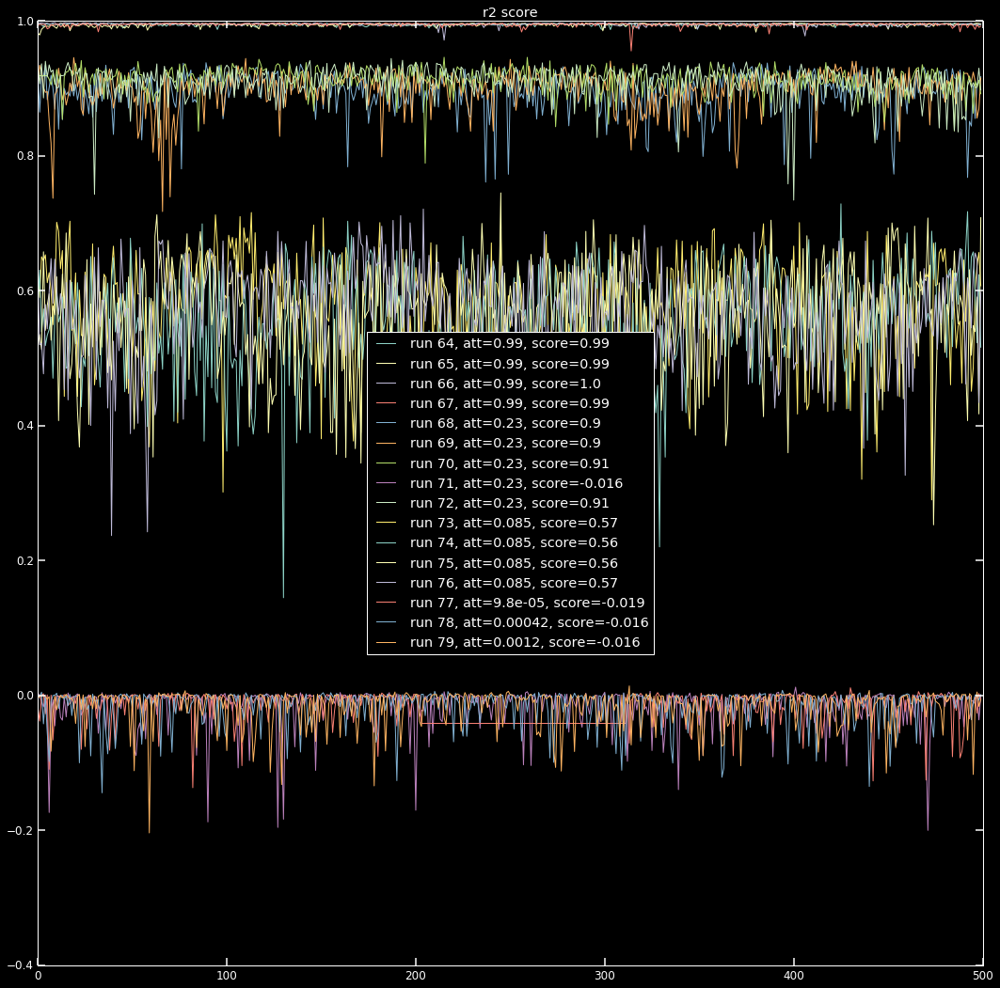

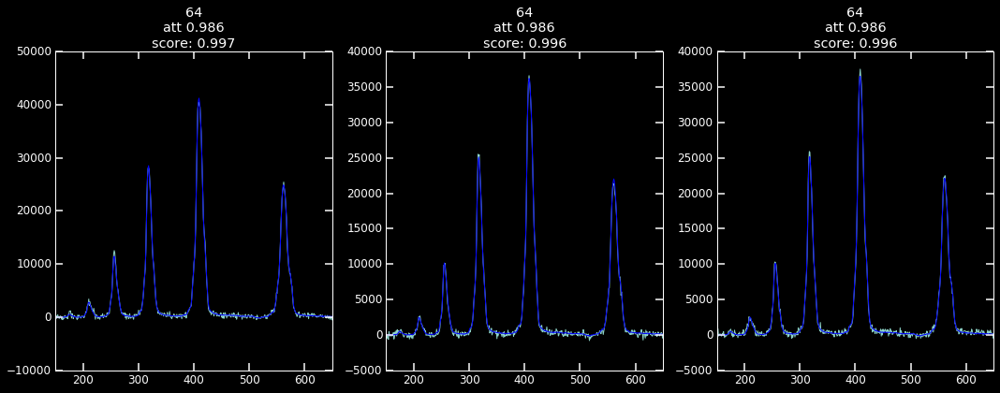

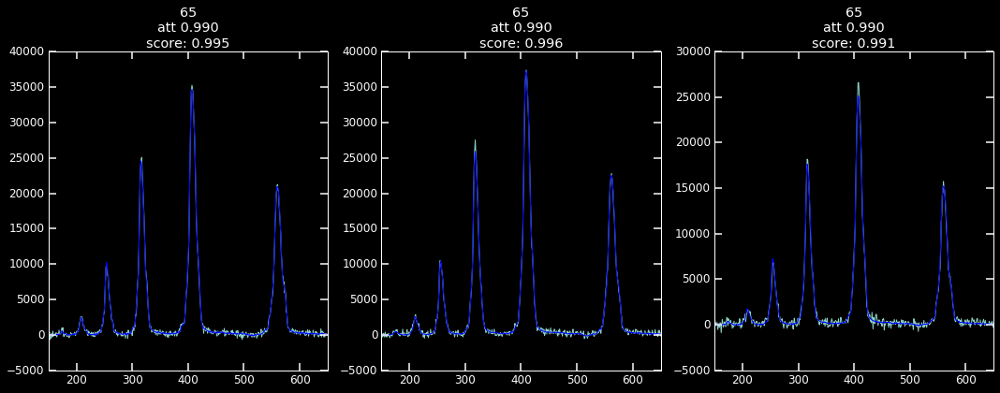

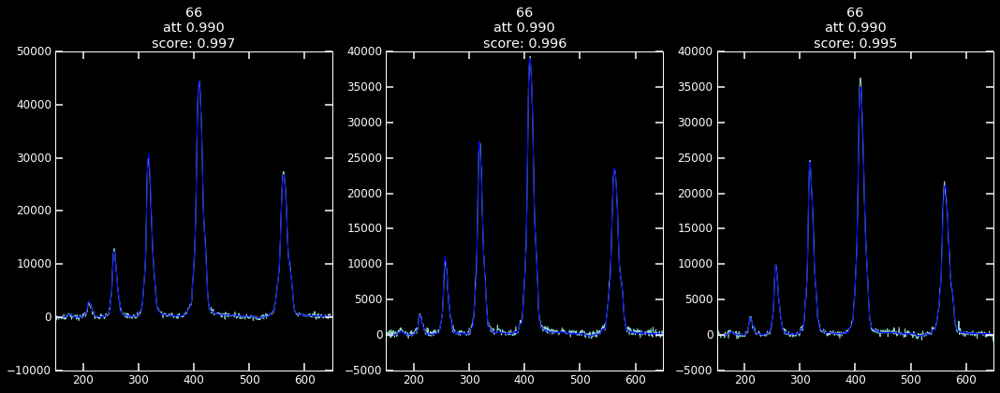

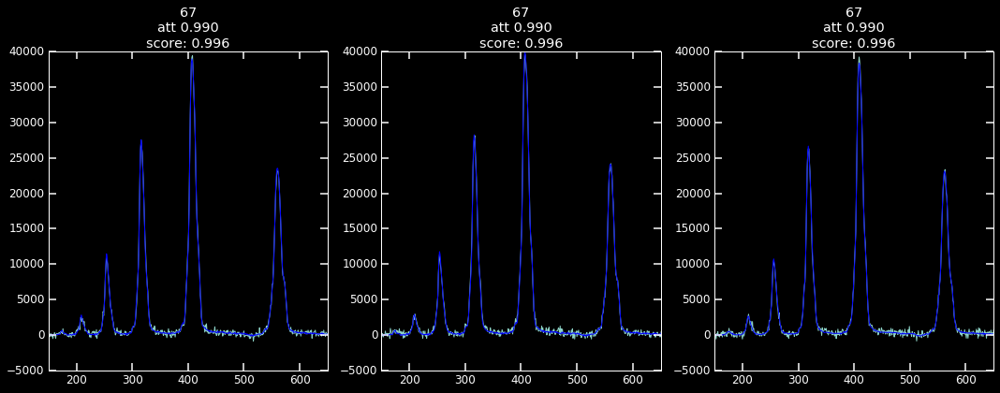

...

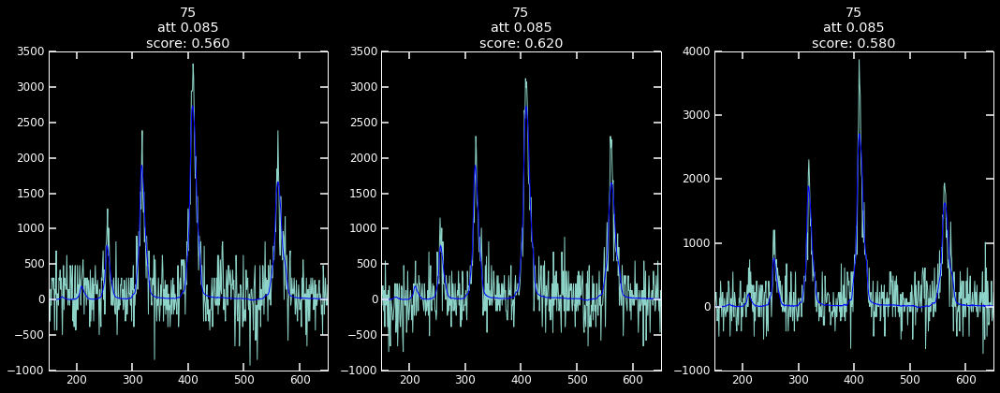

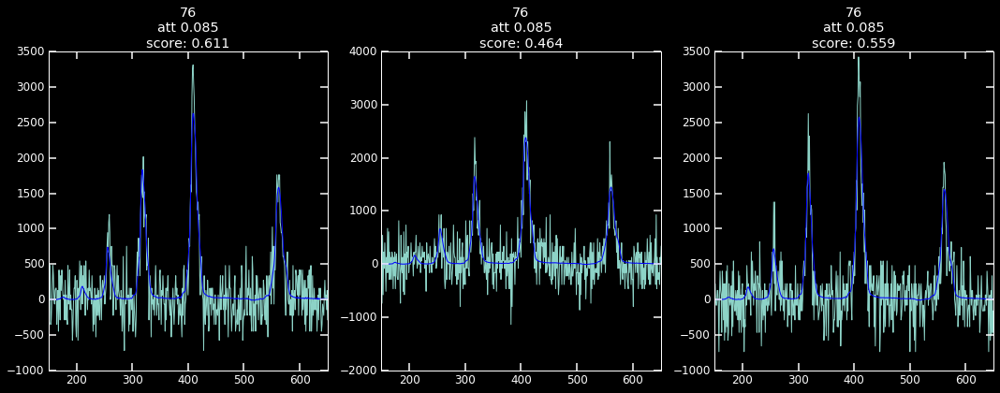

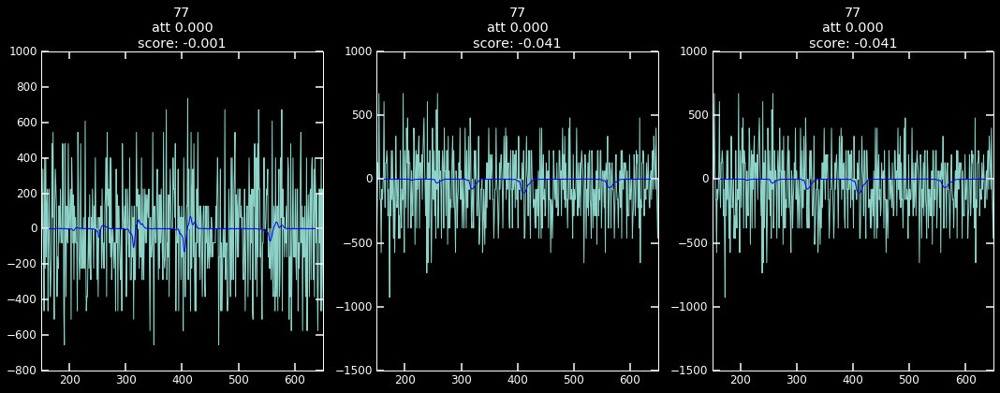

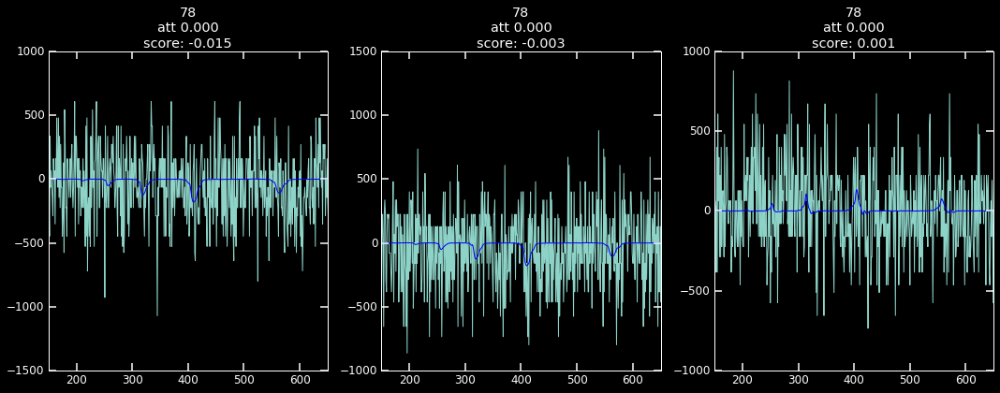

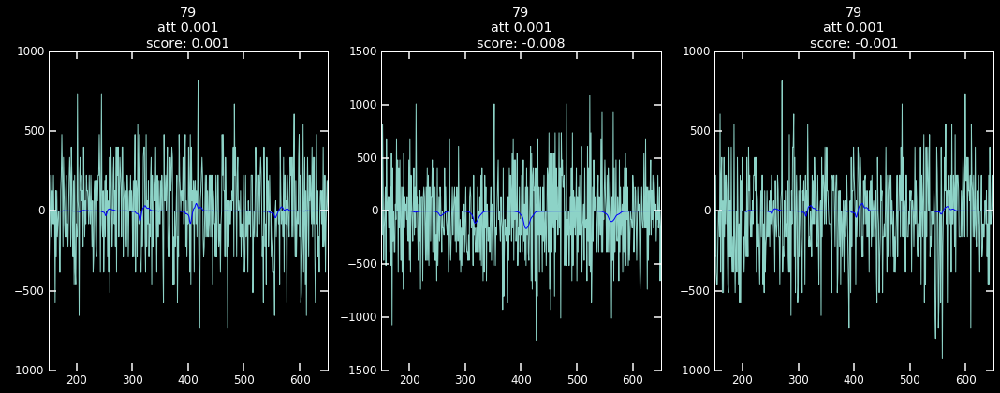

In [12]:
filt = np.logical_and(np.greater(en,740), np.less(en,760))
att_e = att[filt]
rs = runs[filt]

plt_fit = True

n_c = 2
regr = proc.construct_waveformRegressor(wf_ref[1,:100,:], n_components=n_c) # idx 1 = 750eV
scores = []
fig, ax1 = plt.subplots(figsize=(18,18))
ax1.set_title('r2 score')
# fig, ax2 = plt.subplots(figsize=(18,18))
# ax2.set_title('Pearson coeff')
for jj, (rr, at) in enumerate(zip(rs,att_e)):
    fname = data_path / './GMD_r{}.h5'.format(str(rr))
    print(fname)
    with h5.File(fname,'r') as f:
        wf = f['GMD'].value[:,roi[0]:roi[1]]
    wf = np.asarray(wf)
    
    intensities = regr.get_pulse_intensity(wf)
    reconstructed = regr.fit_reconstruct(wf)
    score = regr.score(wf)
    scores.append(score)
    pearson = regr.pearsonr_coeff(wf)
    
    leg = 'run {}, att={:.2}, score={:.2}'.format(rr, at, np.mean(score))
    ax1.plot(score, label=leg)
#     leg = 'run {}, att={:.2}, Pearson={:.2}'.format(rr, at, np.mean(pearson))
#     ax2.plot(pearson, label=leg)
    
    if plt_fit:
        fig, ax = plt.subplots(1,3, figsize=(15,6))
        ax = np.ravel(ax)
        for ii in range(3):
            idx = np.random.randint(wf.shape[0])
            ax[ii].plot(wf[idx])
            ax[ii].plot(reconstructed[idx], 'b')
            ax[ii].set_title('{}\natt {:.3f}\nscore: {:.3f}'.format(rr, att_e[jj], score[idx]))
            ax[ii].set_xlim(150,650)
        plt.tight_layout()
ax1.legend(loc=0)
# ax2.legend(loc=0)
plt.show()

## E = 1000 eV

/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r80.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r81.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r82.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r83.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r84.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r85.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r86.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r87.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r88.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r89.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r90.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r91.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r92.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r93.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r94.h5


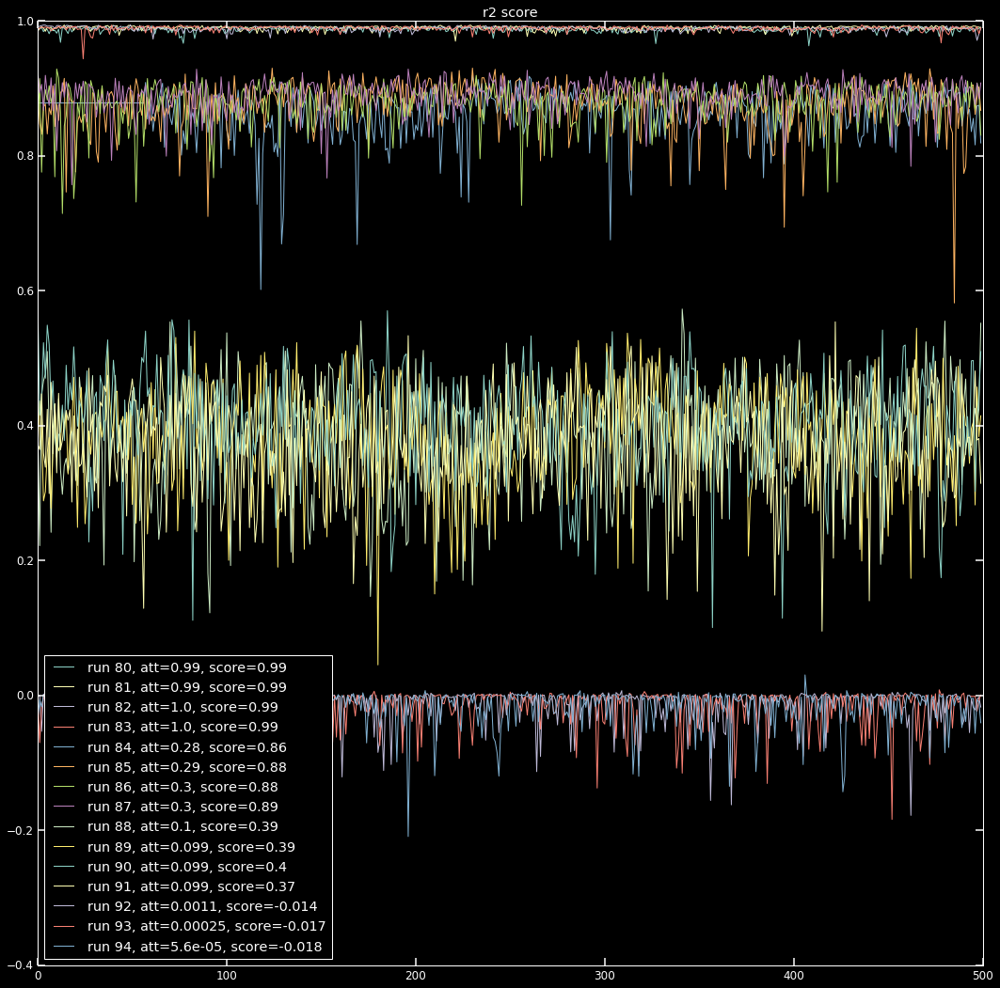

In [13]:
filt = np.logical_and(np.greater(en,990), np.less(en,1010))
att_e = att[filt]
rs = runs[filt]

plt_fit = False

n_c = 2
regr = proc.construct_waveformRegressor(wf_ref[2,:100,:], n_components=n_c) # idx 2 = 1000eV
scores = []
fig, ax1 = plt.subplots(figsize=(18,18))
ax1.set_title('r2 score')
# fig, ax2 = plt.subplots(figsize=(18,18))
# ax2.set_title('Pearson coeff')
for j, (rr, at) in enumerate(zip(rs,att_e)):
    fname = data_path / './GMD_r{}.h5'.format(str(rr))
    print(fname)
    with h5.File(fname,'r') as f:
        wf = f['GMD'].value[:,roi[0]:roi[1]]
    wf = np.asarray(wf)
    
    intensities = regr.get_pulse_intensity(wf)
    reconstructed = regr.fit_reconstruct(wf)
    score = regr.score(wf)
    scores.append(score)
    pearson = regr.pearsonr_coeff(wf)
    
    leg = 'run {}, att={:.2}, score={:.2}'.format(rr, at, np.mean(score))
    ax1.plot(score, label=leg)
#     leg = 'run {}, att={:.2}, Pearson={:.2}'.format(rr, at, np.mean(pearson))
#     ax2.plot(pearson, label=leg)
    
    if plt_fit:
        fig, ax = plt.subplots(1,3, figsize=(15,6))
        ax = np.ravel(ax)
        for ii in range(3):
            idx = np.random.randint(wf.shape[0])
            ax[ii].plot(wf[idx])
            ax[ii].plot(reconstructed[idx], 'b')
            ax[ii].set_title('att {:.3f}\n{}\nscore: {:.3f}'.format(at, str(idx), score[idx]))
            ax[ii].set_xlim(150,650)
        plt.tight_layout()
ax1.legend(loc=0)
# ax2.legend(loc=0)
plt.show()

## E = 1500 eV

/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r95.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r96.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r97.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r98.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r99.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r100.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r101.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r102.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r103.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r104.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r105.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r106.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r107.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r108.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r109.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r110.h5


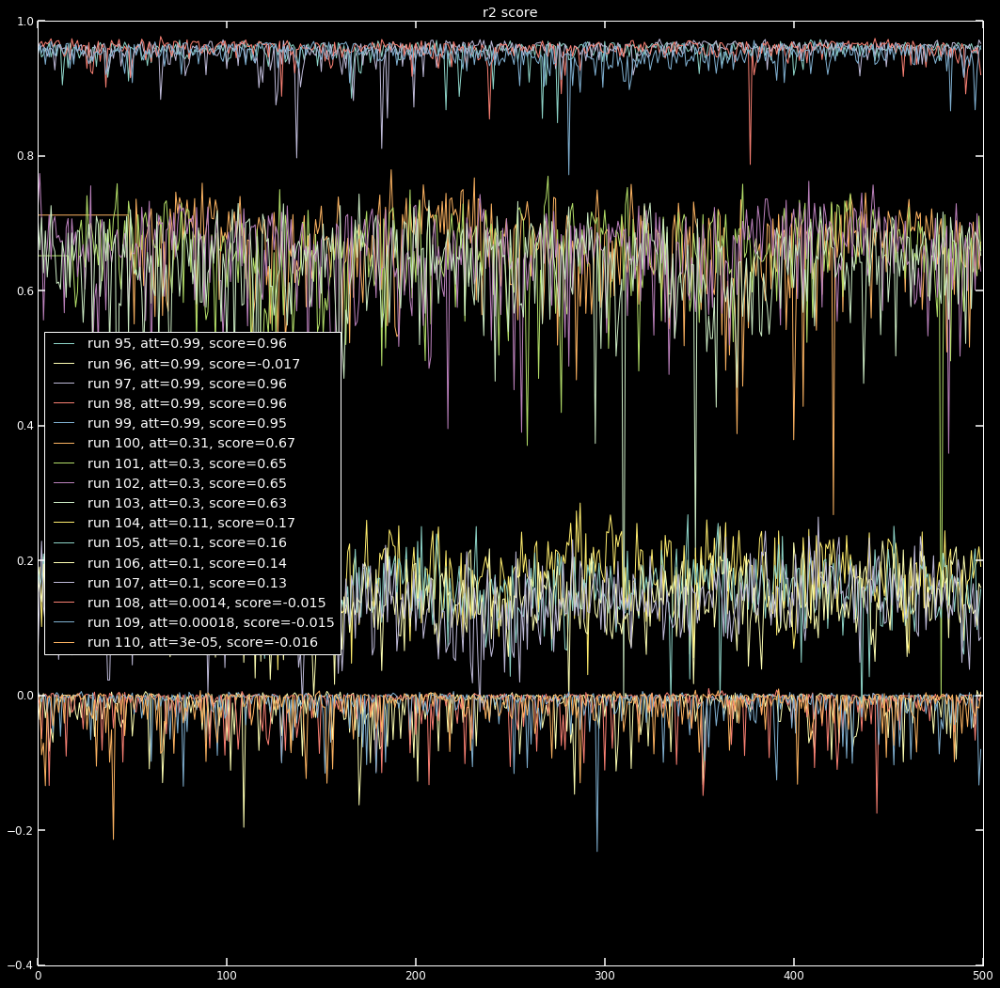

In [14]:
filt = np.logical_and(np.greater(en,1400), np.less(en,1600))
att_e = att[filt]
rs = runs[filt]

plt_fit = False

n_c = 2
regr = proc.construct_waveformRegressor(wf_ref[3,:100,:], n_components=n_c) # idx 2 = 1000eV
scores = []
fig, ax1 = plt.subplots(figsize=(18,18))
ax1.set_title('r2 score')
# fig, ax2 = plt.subplots(figsize=(18,18))
# ax2.set_title('Pearson coeff')
for jj, (rr, at) in enumerate(zip(rs,att_e)):
    fname = data_path / './GMD_r{}.h5'.format(str(rr))
    print(fname)
    with h5.File(fname,'r') as f:
        wf = f['GMD'].value[:,roi[0]:roi[1]]
    wf = np.asarray(wf)
    
    intensities = regr.get_pulse_intensity(wf)
    reconstructed = regr.fit_reconstruct(wf)
    score = regr.score(wf)
    scores.append(score)
    pearson = regr.pearsonr_coeff(wf)
    
    leg = 'run {}, att={:.2}, score={:.2}'.format(rr, at, np.mean(score))
    ax1.plot(score, label=leg)
#     leg = 'run {}, att={:.2}, Pearson={:.2}'.format(rr, at, np.mean(pearson))
#     ax2.plot(pearson, label=leg)
    
    if plt_fit:
        fig, ax = plt.subplots(1,3, figsize=(15,6))
        ax = np.ravel(ax)
        for ii in range(3):
            idx = np.random.randint(wf.shape[0])
            ax[ii].plot(wf[idx])
            ax[ii].plot(reconstructed[idx], 'b')
            ax[ii].set_title('att {:.3f}\n{}\nscore: {:.3f}'.format(at, str(idx), score[idx]))
            ax[ii].set_xlim(150,650)
        plt.tight_layout()
ax1.legend(loc=0)
# ax2.legend(loc=0)
plt.show()

# Build independent basis vector for each peak

The reference waveforms are taken at the highest energies, because the higher ionization states are more visible.

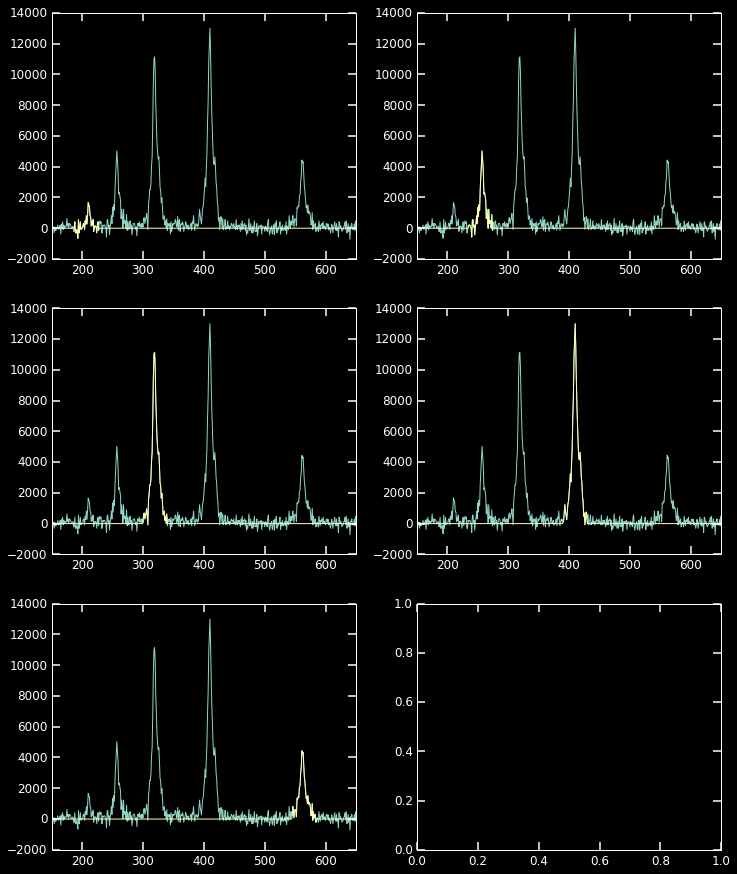

(500, 1100)
(500, 1100)
(500, 1100)
(500, 1100)
(500, 1100)


In [15]:
# index range for each peak
width = np.array([-20,20])
p1 = 208+width
p2 = 255+width
p3 = 320+width
p4 = 410+width
p5 = 565+width
peaks = np.vstack([p1,p2,p3,p4,p5])

dat = wf_ref[3]
dat_single = []
fig, ax = plt.subplots(3,2, figsize=(12,15))
ax = np.ravel(ax)
for ii, p in enumerate(peaks):
    ax[ii].plot(dat[0])
    temp = np.copy(dat)
    temp[:,:p[0]] = 0
    temp[:,p[1]:] = 0
    dat_single.append(temp)
    ax[ii].plot(temp[0])
    ax[ii].set_xlim(150,650)
plt.show()
for dd in dat_single:
    print(dd.shape)

5.85994130158e-62


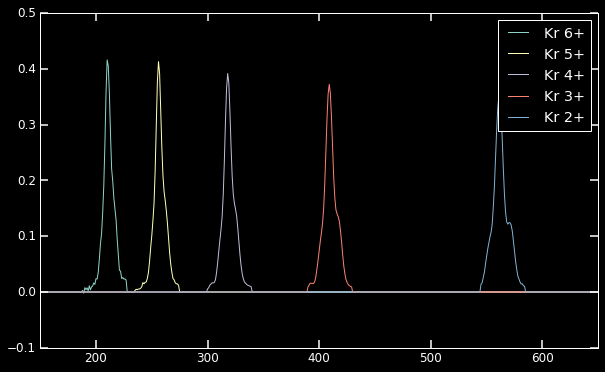

(1100, 10)
(10, 1100)


In [16]:
n_c = 2
A = []
proj = []
for ii, dat_s in enumerate(dat_single):
    temp_a, temp_proj, svd = proc.get_basis_and_projector(dat_s, n_components=n_c)
    A.append(temp_a)
    proj.append(temp_proj)
A = np.concatenate(A, axis=1)
proj = np.concatenate(proj, axis=0)

print(A[:,0].dot(A[:,2]))

fig, ax = plt.subplots()
label = ['Kr 6+','Kr 5+','Kr 4+','Kr 3+','Kr 2+']
for ii in np.arange(0,5*n_c, n_c):
    ax.plot(A[:,ii], label=label[int(ii/n_c)])
ax.set_xlim(150,650)
ax.legend(loc=0)
plt.show()
print(A.shape)
print(proj.shape)

## Repeat the fit with same single-feature basis for all energies

### E = 750 eV

/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r64.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r65.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r66.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r67.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r68.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r69.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r70.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r71.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r72.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r73.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r74.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r75.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r76.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r77.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r78.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r79.h5


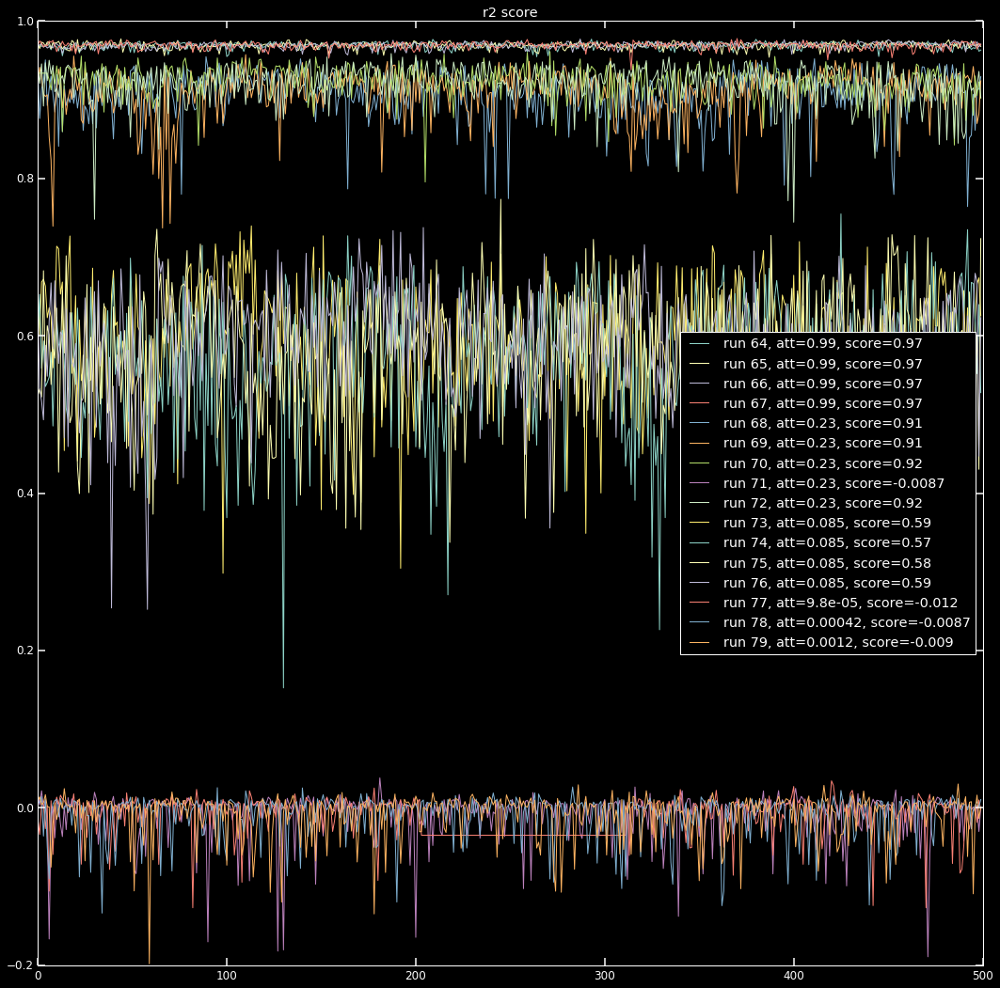

In [19]:
filt = np.logical_and(np.greater(en,740), np.less(en,760))
att_e = att[filt]
rs = runs[filt]
plt_fit = False

n_c = 2
regr = proc.WaveformRegressor(A=A, projector=proj, n_pulse=5)
scores = []
fig, ax1 = plt.subplots(figsize=(18,18))
ax1.set_title('r2 score')
# fig, ax2 = plt.subplots(figsize=(18,18))
# ax2.set_title('Pearson coeff')
for jj, (rr, at) in enumerate(zip(rs,att_e)):
    fname = data_path / './GMD_r{}.h5'.format(str(rr))
    print(fname)
    with h5.File(fname,'r') as f:
        wf = f['GMD'].value[:,roi[0]:roi[1]]
    wf = np.asarray(wf)
    
    intensities = regr.get_pulse_intensity(wf)
    reconstructed = regr.fit_reconstruct(wf)
    score = regr.score(wf)
    scores.append(score)
    pearson = regr.pearsonr_coeff(wf)
    
    leg = 'run {}, att={:.2}, score={:.2}'.format(rr, at, np.mean(score))
    ax1.plot(score, label=leg)
#     leg = 'run {}, att={:.2}, Pearson={:.2}'.format(rr, at, np.mean(pearson))
#     ax2.plot(pearson, label=leg)
    
    if plt_fit:
        fig, ax = plt.subplots(1,3, figsize=(15,6))
        ax = np.ravel(ax)
        for ii in range(3):
            idx = np.random.randint(wf.shape[0])
            ax[ii].plot(wf[idx])
            ax[ii].plot(reconstructed[idx], 'b')
            ax[ii].set_title('att {:.3f}\n{}\nscore: {:.3f}'.format(at, str(idx), score[idx]))
            ax[ii].set_xlim(150,650)
        plt.tight_layout()
ax1.legend(loc=0)
# ax2.legend(loc=0)
plt.show()

### E = 1000 eV

/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r80.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r81.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r82.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r83.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r84.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r85.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r86.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r87.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r88.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r89.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r90.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r91.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r92.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r93.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r94.h5


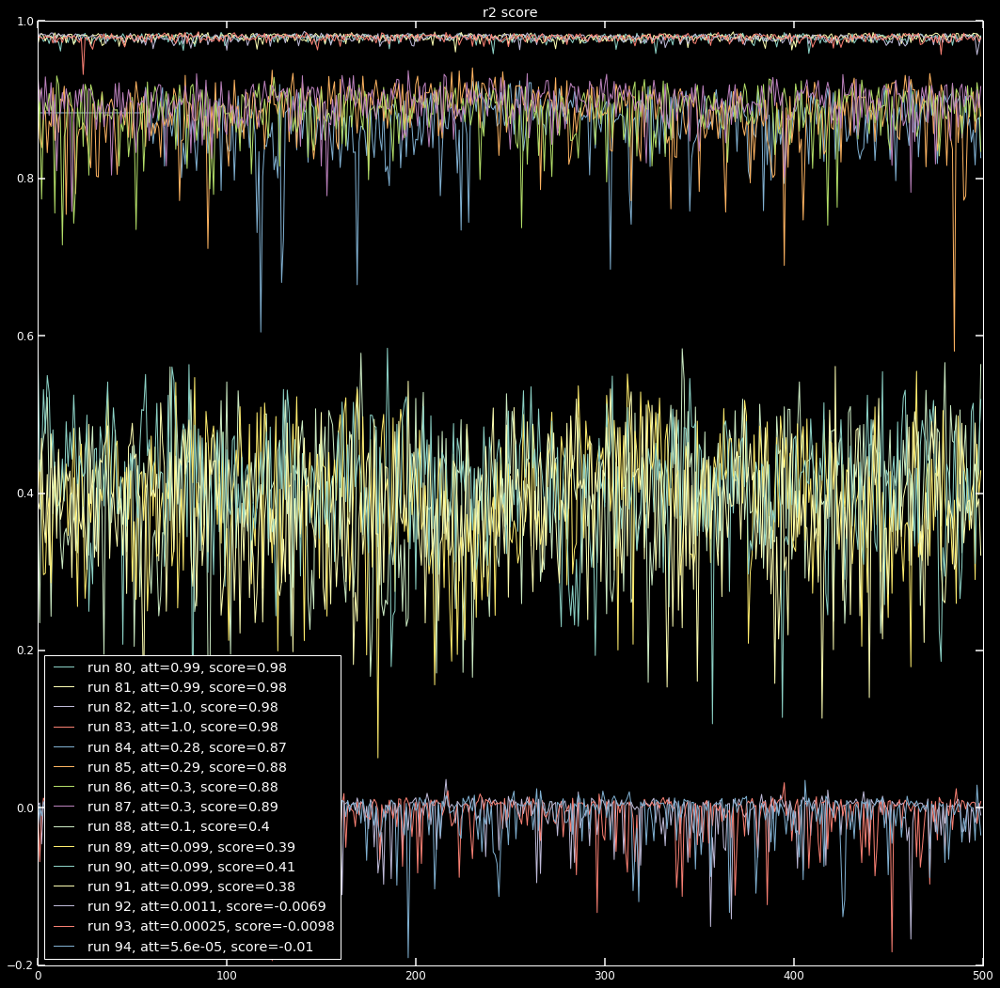

In [20]:
filt = np.logical_and(np.greater(en,990), np.less(en,1010))
att_e = att[filt]
rs = runs[filt]
plt_fit = False

n_c = 2
regr = proc.WaveformRegressor(A=A, projector=proj, n_pulse=5)
scores = []
fig, ax1 = plt.subplots(figsize=(18,18))
ax1.set_title('r2 score')
# fig, ax2 = plt.subplots(figsize=(18,18))
# ax2.set_title('Pearson coeff')
for jj, (rr, at) in enumerate(zip(rs,att_e)):
    fname = data_path / './GMD_r{}.h5'.format(str(rr))
    print(fname)
    with h5.File(fname,'r') as f:
        wf = f['GMD'].value[:,roi[0]:roi[1]]
    wf = np.asarray(wf)
    
    intensities = regr.get_pulse_intensity(wf)
    reconstructed = regr.fit_reconstruct(wf)
    score = regr.score(wf)
    scores.append(score)
    pearson = regr.pearsonr_coeff(wf)
    
    leg = 'run {}, att={:.2}, score={:.2}'.format(rr, at, np.mean(score))
    ax1.plot(score, label=leg)
#     leg = 'run {}, att={:.2}, Pearson={:.2}'.format(rr, at, np.mean(pearson))
#     ax2.plot(pearson, label=leg)
    
    if plt_fit:
        fig, ax = plt.subplots(1,3, figsize=(15,6))
        ax = np.ravel(ax)
        for ii in range(3):
            idx = np.random.randint(wf.shape[0])
            ax[ii].plot(wf[idx])
            ax[ii].plot(reconstructed[idx], 'b')
            ax[ii].set_title('att {:.3f}\n{}\nscore: {:.3f}'.format(at, str(idx), score[idx]))
            ax[ii].set_xlim(150,650)
        plt.tight_layout()
ax1.legend(loc=0)
# ax2.legend(loc=0)
plt.show()

### E = 1500 eV

/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r95.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r96.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r97.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r98.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r99.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r100.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r101.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r102.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r103.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r104.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r105.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r106.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r107.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r108.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r109.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r110.h5


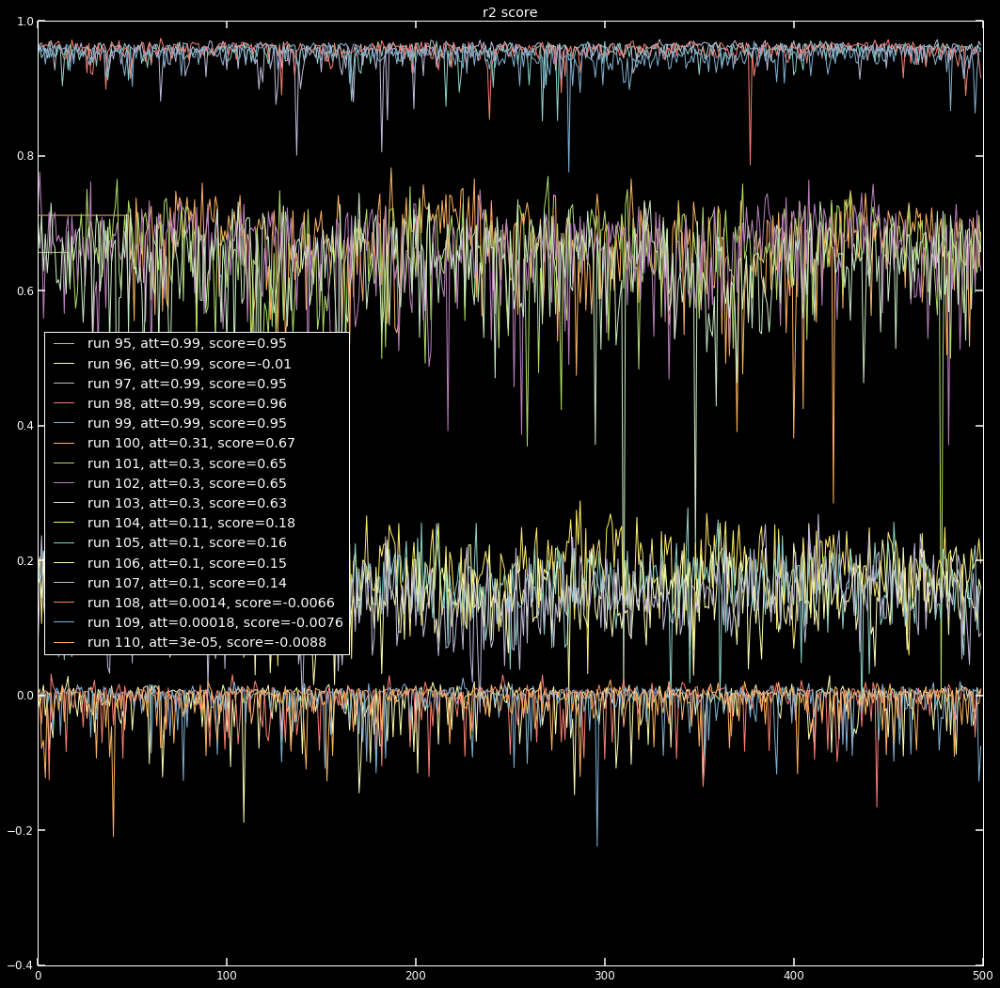

In [21]:
filt = np.logical_and(np.greater(en,1400), np.less(en,1600))
att_e = att[filt]
rs = runs[filt]

plt_fit = False

n_c = 2
regr = proc.WaveformRegressor(A=A, projector=proj, n_pulse=5)
scores = []
fig, ax1 = plt.subplots(figsize=(18,18))
ax1.set_title('r2 score')
# fig, ax2 = plt.subplots(figsize=(18,18))
# ax2.set_title('Pearson coeff')
for jj, (rr, at) in enumerate(zip(rs,att_e)):
    fname = data_path / './GMD_r{}.h5'.format(str(rr))
    print(fname)
    with h5.File(fname,'r') as f:
        wf = f['GMD'].value[:,roi[0]:roi[1]]
    wf = np.asarray(wf)
    
    intensities = regr.get_pulse_intensity(wf)
    reconstructed = regr.fit_reconstruct(wf)
    score = regr.score(wf)
    scores.append(score)
    pearson = regr.pearsonr_coeff(wf)
    
    leg = 'run {}, att={:.2}, score={:.2}'.format(rr, at, np.mean(score))
    ax1.plot(score, label=leg)
#     leg = 'run {}, att={:.2}, Pearson={:.2}'.format(rr, at, np.mean(pearson))
#     ax2.plot(pearson, label=leg)
    
    if plt_fit:
        fig, ax = plt.subplots(1,3, figsize=(15,6))
        ax = np.ravel(ax)
        for ii in range(3):
            idx = np.random.randint(wf.shape[0])
            ax[ii].plot(wf[idx])
            ax[ii].plot(reconstructed[idx], 'b')
            ax[ii].set_title('att {:.3f}\n{}\nscore: {:.3f}'.format(at, str(idx), score[idx]))
            ax[ii].set_xlim(150,650)
        plt.tight_layout()
ax1.legend(loc=0)
# ax2.legend(loc=0)
plt.show()

# Basis for each run

/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r64.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r65.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r66.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r67.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r68.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r69.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r70.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r71.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r72.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r73.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r74.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r75.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r76.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r77.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r78.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r79.h5


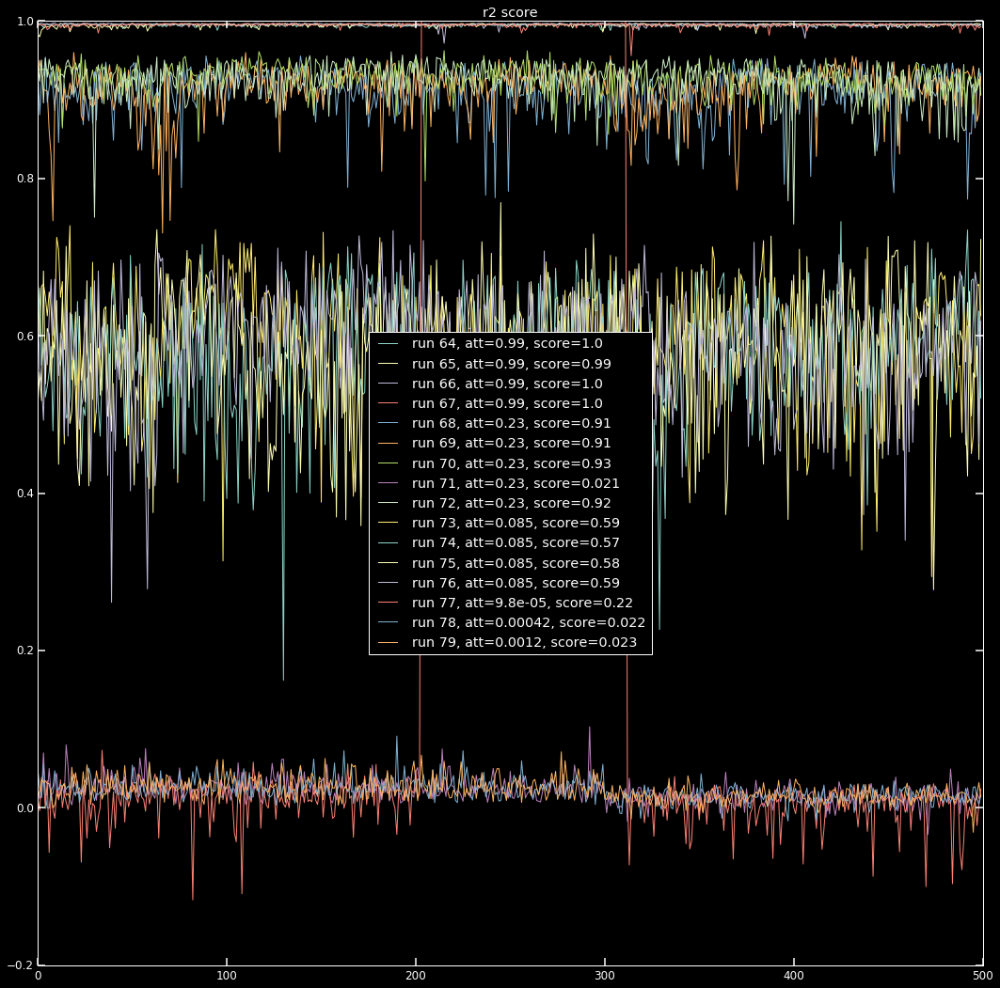

In [22]:
E = 750
filt = np.logical_and(np.greater(en,E-50), np.less(en,E+50))
att_e = att[filt]
rs = runs[filt]

n_c = 2
scores = []
fig, ax1 = plt.subplots(figsize=(18,18))
ax1.set_title('r2 score')
# fig, ax2 = plt.subplots(figsize=(18,18))
# ax2.set_title('Pearson coeff')
for jj, (rr, at) in enumerate(zip(rs,att_e)):
    fname = data_path / './GMD_r{}.h5'.format(str(rr))
    print(fname)
    with h5.File(fname,'r') as f:
        wf = f['GMD'].value[:,roi[0]:roi[1]]
    wf = np.asarray(wf)
    
    regr = proc.construct_waveformRegressor(wf[:300,:], n_components=n_c)
    
    intensities = regr.get_pulse_intensity(wf)
    reconstructed = regr.fit_reconstruct(wf)
    score = regr.score(wf)
    scores.append(score)
    pearson = regr.pearsonr_coeff(wf)
    
    leg = 'run {}, att={:.2}, score={:.2}'.format(rr, at, np.mean(score))
    ax1.plot(score, label=leg)
#     leg = 'run {}, att={:.2}, Pearson={:.2}'.format(rr, at, np.mean(pearson))
#     ax2.plot(pearson, label=leg)
    
    if plt_fit:
        fig, ax = plt.subplots(1,3, figsize=(15,6))
        ax = np.ravel(ax)
        for ii in range(3):
            idx = np.random.randint(wf.shape[0])
            ax[ii].plot(wf[idx])
            ax[ii].plot(reconstructed[idx], 'b')
            ax[ii].set_title('att {:.3f}\n{}\nscore: {:.3f}'.format(at, str(idx), score[idx]))
            ax[ii].set_xlim(150,650)
        plt.tight_layout()
ax1.legend(loc=0)
# ax2.legend(loc=0)
plt.show()

## Compare score between the run basis and the multipulse basis

/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r80.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r81.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r82.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r83.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r84.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r85.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r86.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r87.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r88.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r89.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r90.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r91.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r92.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r93.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r94.h5


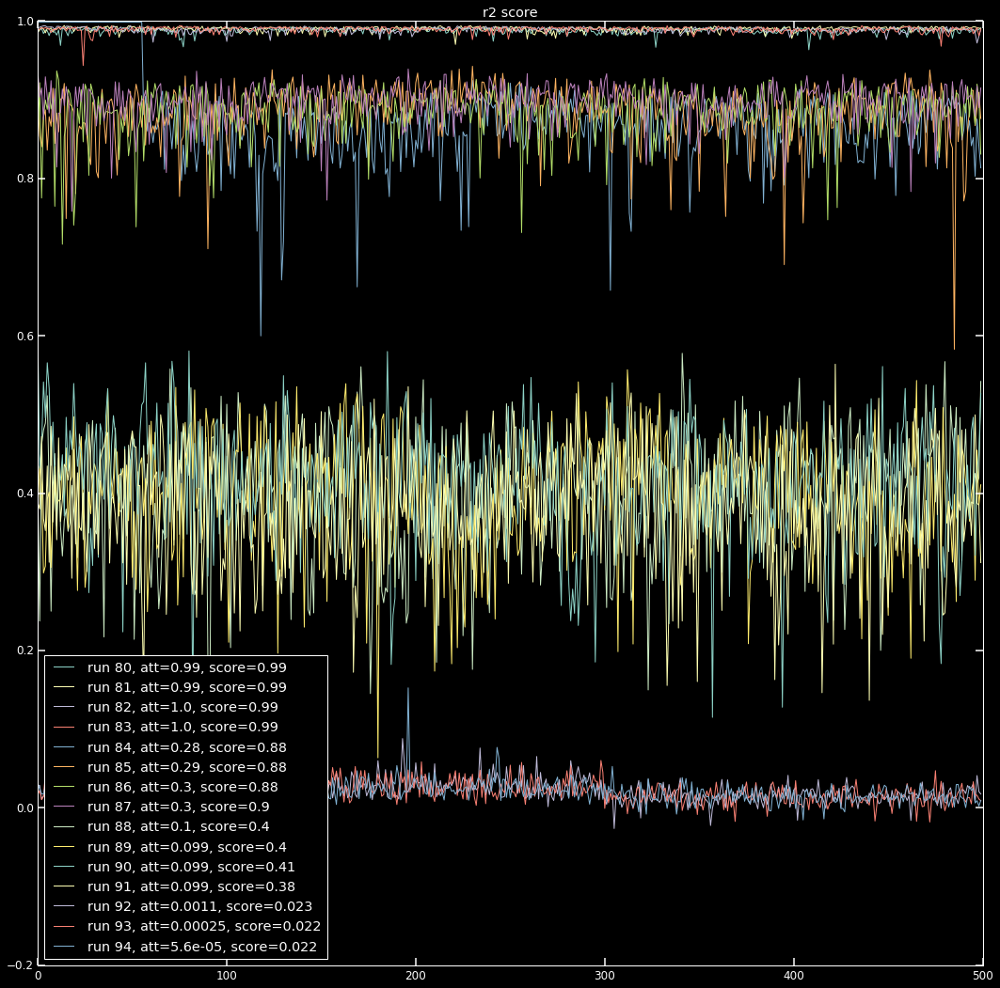

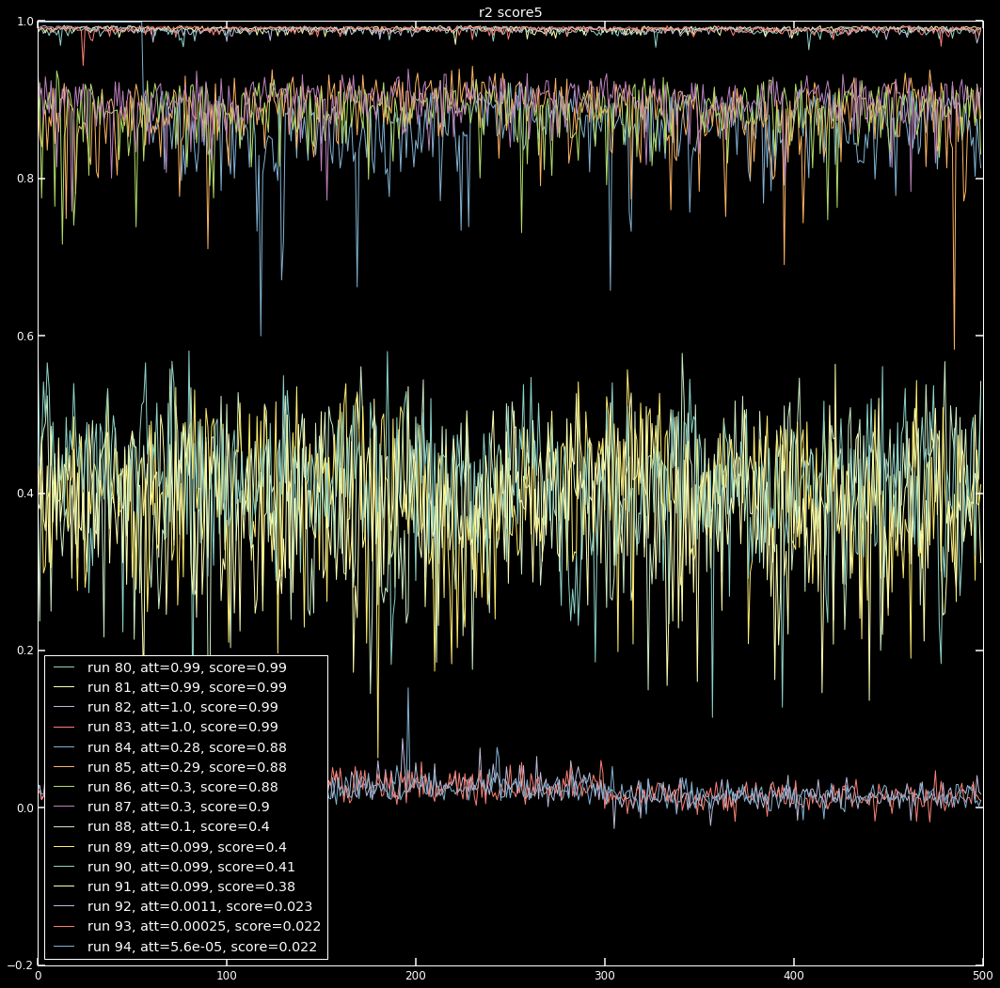

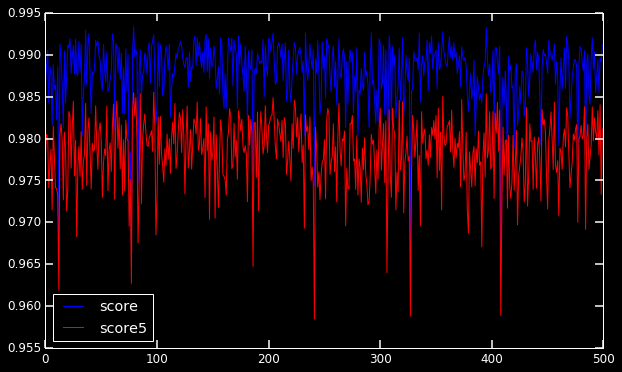

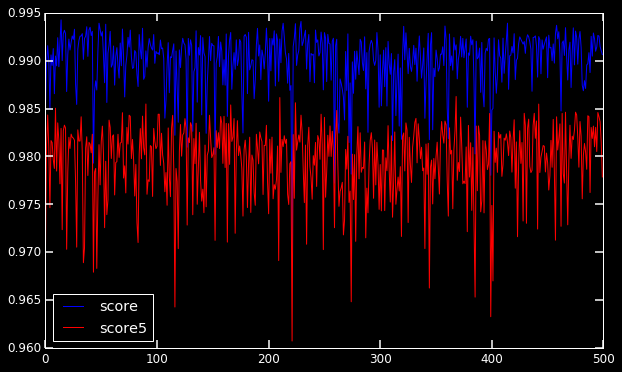

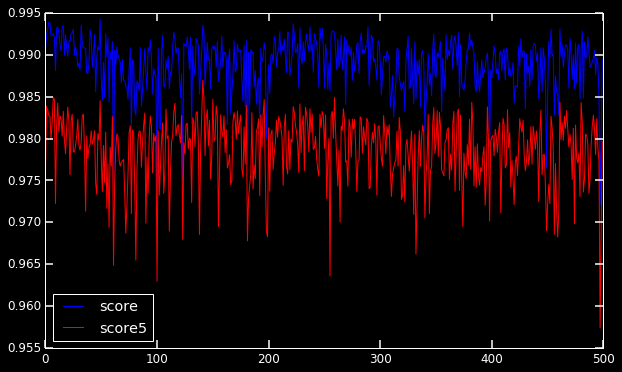

...

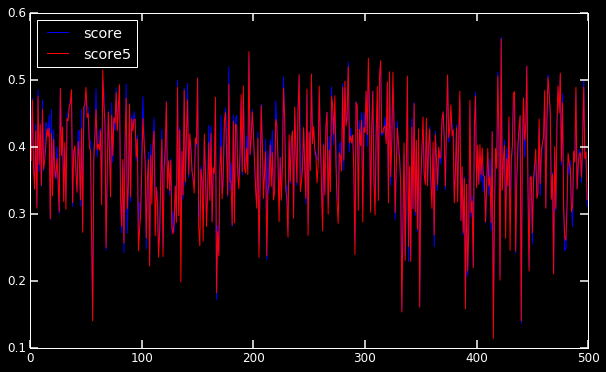

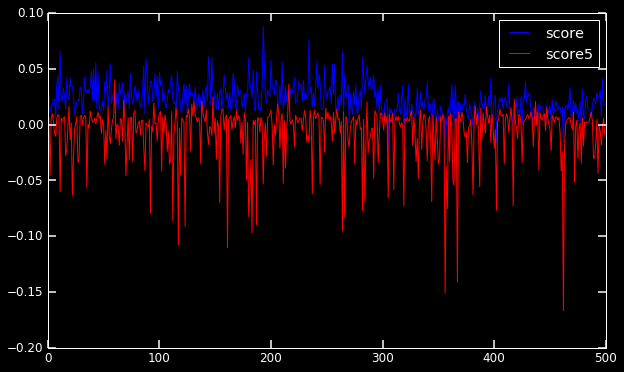

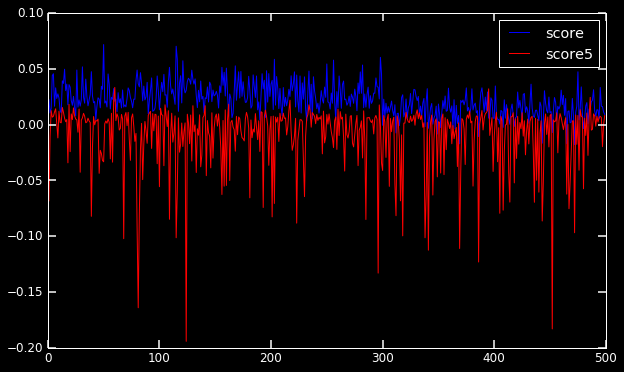

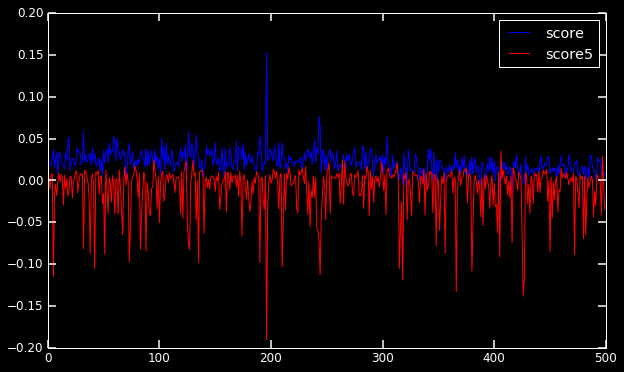

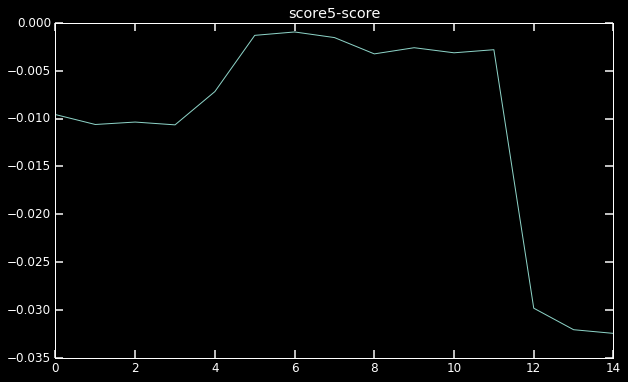

In [23]:
E = 1000
filt = np.logical_and(np.greater(en,E-50), np.less(en,E+50))
att_e = att[filt]
rs = runs[filt]

n_c = 2
regr5 = proc.WaveformRegressor(A=A, projector=proj, n_pulse=5)

scores = []
fig, ax1 = plt.subplots(figsize=(18,18))
ax1.set_title('r2 score')
fig, ax2 = plt.subplots(figsize=(18,18))
ax2.set_title('r2 score5')
# fig, ax2 = plt.subplots(figsize=(18,18))
# ax2.set_title('Pearson coeff')
for jj, (rr, at) in enumerate(zip(rs,att_e)):
    fname = data_path / './GMD_r{}.h5'.format(str(rr))
    print(fname)
    with h5.File(fname,'r') as f:
        wf = f['GMD'].value[:,roi[0]:roi[1]]
    wf = np.asarray(wf)
    
    regr = proc.construct_waveformRegressor(wf[:300,:], n_components=n_c)
    intensities = regr.get_pulse_intensity(wf)
    reconstructed = regr.fit_reconstruct(wf)
    score = regr.score(wf)
    
    intensities5 = regr5.get_pulse_intensity(wf)
    score5 = regr5.score(wf)
    
    leg = 'run {}, att={:.2}, score={:.2}'.format(rr, at, np.mean(score))
    ax1.plot(score, label=leg)
    
    leg = 'run {}, att={:.2}, score={:.2}'.format(rr, at, np.mean(score))
    ax2.plot(score, label=leg)
    
    scores.append(np.mean(score5-score))
    
    fig, ax = plt.subplots()
    ax.plot(score, 'b', label='score')
    ax.plot(score5, 'r', label='score5')
    ax.set_title('run {}''.format(rr))
    ax.legend(loc=0)
    
ax1.legend(loc=0)
ax2.legend(loc=0)

plt.subplots()
plt.plot(scores)
plt.title('score5-score')
plt.show()

# Fit vs I0 (gmd milliJoulesPerPulse)

In [34]:
E = 750
filt = np.logical_and(np.greater(en,E-50), np.less(en,E+50))
att_e = att[filt]
rs = runs[filt]
plt_fit = False
# att_e = att[runs==rs[0]]


n_c = 2
regr5 = proc.WaveformRegressor(A=A, projector=proj, n_pulse=5)

scores = []
intensities = []
scores5 = []
intensities5 = []
I0 = []
# fig, ax1 = plt.subplots(figsize=(18,18))
# ax1.set_title('r2 score')
# fig, ax2 = plt.subplots(figsize=(18,18))
# ax2.set_title('Pearson coeff')
for jj, (rr, at) in enumerate(zip(rs,att_e)):
    fname = data_path / './GMD_r{}.h5'.format(str(rr))
    print(fname)
    with h5.File(fname,'r') as f:
        wf = f['GMD'].value[:,roi[0]:roi[1]]
        I0.append(f['gmd_I0'].value)
    wf = np.asarray(wf)
    
    regr = proc.construct_waveformRegressor(wf[:300,:], n_components=n_c)
    
    intensities.append(regr.get_pulse_intensity(wf))
    reconstructed = regr.fit_reconstruct(wf)
    score = regr.score(wf)
    scores.append(score)
    pearson = regr.pearsonr_coeff(wf)
    
    intensities5.append(regr5.get_pulse_intensity(wf, mode='max'))
    scores5.append(regr5.score(wf))
    
    
#     leg = 'run {}, att={:.2}, score={:.2}'.format(rr, at, np.mean(score))
#     ax1.plot(score, label=leg)
#     leg = 'run {}, att={:.2}, Pearson={:.2}'.format(rr, at, np.mean(pearson))
#     ax2.plot(pearson, label=leg)
    
    if plt_fit:
        fig, ax = plt.subplots(1,3, figsize=(15,6))
        ax = np.ravel(ax)
        for ii in range(3):
            idx = np.random.randint(wf.shape[0])
            ax[ii].plot(wf[idx])
            ax[ii].plot(reconstructed[idx], 'b')
            ax[ii].set_title('att {:.3f}\n{}\nscore: {:.3f}'.format(at, str(idx), score[idx]))
            ax[ii].set_xlim(150,650)
        plt.tight_layout()
# ax1.legend(loc=0)
# ax2.legend(loc=0)
# plt.show()

intensities = np.asarray(intensities).squeeze()
I0 = np.asarray(I0)
intensities5 = np.asarray(intensities5).squeeze()

/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r64.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r65.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r66.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r67.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r68.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r69.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r70.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r71.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r72.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r73.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r74.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r75.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r76.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r77.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r78.h5
/reg/d/psdm/sxr/sxr12416/results/vesp/GMD_r79.h5


### Single vector fit

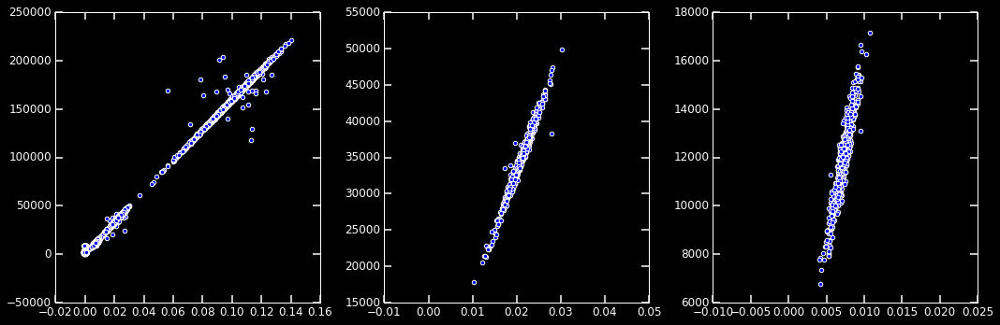

In [35]:
fig, axs = plt.subplots(ncols=3, figsize=(15,5))
axs[0].scatter(I0.ravel(), intensities.ravel())
axs[1].scatter(I0[4], intensities[4])
axs[2].scatter(I0[11], intensities[11])
plt.tight_layout()
plt.show()

### Multi-pulse basis

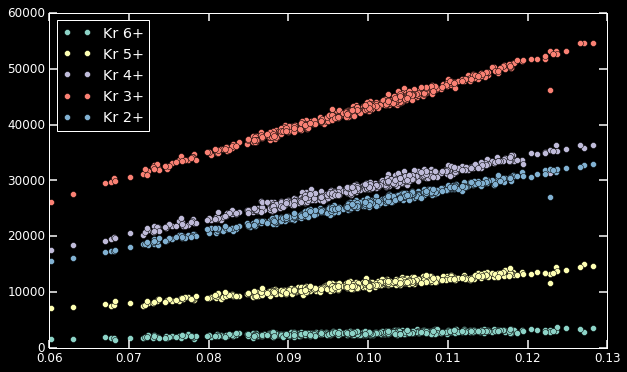

In [36]:
fig, ax = plt.subplots()
peaks = ['Kr 6+','Kr 5+','Kr 4+','Kr 3+','Kr 2+']
rr = 0
for ii in range(5):
    ax.plot(I0[rr], intensities5[rr,:,ii], 'o', label=peaks[ii])
ax.legend(loc=0)
plt.show()

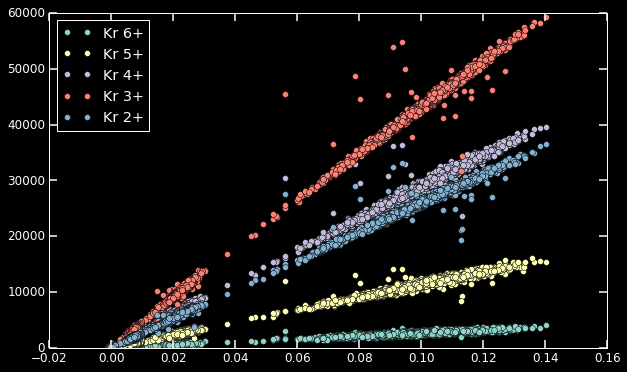

In [37]:
fig, ax = plt.subplots()
for ii in range(5):
    ax.plot(I0.ravel(), intensities5[:,:,ii].ravel(), 'o', label=label[ii])
ax.legend(loc=0)
plt.show()

# Branching ratios

Ratio to calculate:
σ+ / σ3+ = 0.076

σ2+ / σ3+ = 0.77

σ4+ / σ3+ = 0.508

σ5+ / σ3+ = 0.159

σ6+ / σ3 = 0.034

Are the cross-section correction large? Is seems I really dont 

In [38]:
peaks = ['Kr 6+','Kr 5+','Kr 4+','Kr 3+','Kr 2+']
r23 = intensities5[:,:,4]/intensities5[:,:,3]
r43 = intensities5[:,:,2]/intensities5[:,:,3]
r53 = intensities5[:,:,1]/intensities5[:,:,3]
r63 = intensities5[:,:,0]/intensities5[:,:,3]
ratios = [r23, r43, r53, r63]

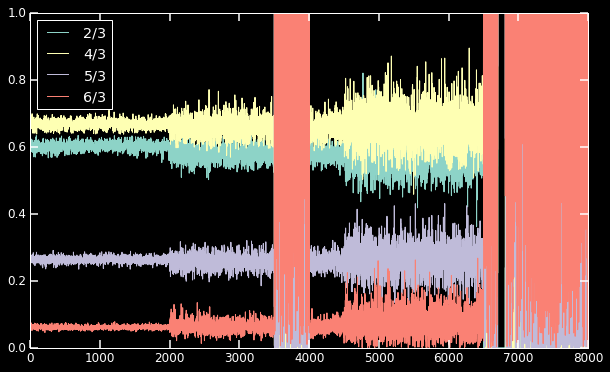

In [39]:
fig, ax = plt.subplots()
lab = ['2/3', '4/3', '5/3', '6/3']
for rr, ll in zip(ratios,lab):
    plt.plot(rr.ravel(), label=ll)
plt.ylim(0,1)
plt.legend(loc=0)
plt.show()

In [40]:
np.mean(r43.ravel()[:1000])

0.66820995269011185